# Data Retrieval

In [ ]:
import pandas as pd
from six.moves import urllib
import os
import numpy as np
from bs4 import BeautifulSoup
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
import torchvision
from torchvision import transforms, datasets, models
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

#from google.colab import drive

#INPUT_PATH = os.path.join(".", "input")
#os.makedirs(INPUT_PATH, exist_ok=True)
!git clone https://github.com/Linusky17/Face-Mask-Detection.git


Cloning into 'Face-Mask-Detection'...
remote: Enumerating objects: 2433, done.
remote: Counting objects: 100% (77/77), done.
remote: Compressing objects: 100% (66/66), done.
remote: Total 2433 (delta 14), reused 73 (delta 10), pack-reused 2356
Receiving objects: 100% (2433/2433), 578.59 MiB | 54.55 MiB/s, done.
Resolving deltas: 100% (855/855), done.
Checking out files: 100% (2425/2425), done.


In [ ]:
#!pwd
#!cd "Face-Mask-Detection"
os.chdir('Face-Mask-Detection')

In [ ]:
!pwd

/content/Face-Mask-Detection


# Preparations & Helper Functions

In [ ]:
def generate_target(image_id, file): 
    with open(file) as f:
        soup = BeautifulSoup(f.read(), 'xml')
        xml_objects = soup.find_all('object')

        boxes = []
        labels = []
        for xml_obj in xml_objects:
          xmin = int(xml_obj.find('xmin').text)
          xmax = int(xml_obj.find('xmax').text)
          ymin = int(xml_obj.find('ymin').text)
          ymax = int(xml_obj.find('ymax').text)
          boxes.append([xmin, ymin, xmax, ymax])

          if xml_obj.find('name').text == "with_mask":
              labels.append(3)
          elif xml_obj.find('name').text == "mask_weared_incorrect":
              labels.append(3)

          else: # no mask
              labels.append(1)


        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        img_id = torch.tensor([image_id])
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = img_id
        
        return target

In [ ]:
imgs = list(sorted(os.listdir("FMD/images")))

In [ ]:
labels = list(sorted(os.listdir("FMD/annotations")))

In [ ]:
class Dataset(object):
    def __init__(self, transforms):
        self.imgs = list(sorted(os.listdir("FMD/images/")))
        self.transforms = transforms

    def __getitem__(self, idx):
        img_path = os.path.join("FMD/images/", 'maksssksksss'+ str(idx) + '.png')
        label_path = os.path.join("FMD/annotations/", 'maksssksksss'+ str(idx) + '.xml')
        img = Image.open(img_path).convert("RGB")
        target = generate_target(idx, label_path)
        
        img = self.transforms(img)

        return img, target

    def __len__(self):
        return len(self.imgs)

In [ ]:
def collate_fn(batch):
    return tuple(zip(*batch))

data_transform = transforms.Compose([
        transforms.ToTensor(), 
    ])

dataset = Dataset(data_transform)
#train_size = int(0.8 * len(dataset))
#test_size = len(dataset) - train_size

#train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])
data_loader = torch.utils.data.DataLoader(dataset, batch_size=4, collate_fn=collate_fn)

In [ ]:
torch.cuda.is_available()

True

# Get Base Model (Faster RCNN ResNet 50)

In [ ]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True) # Gets faster rcnn and resnet50 pretrained network
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, 4)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


In [ ]:
if torch.cuda.is_available():
  device = torch.device('cuda') 

# Model Training

In [ ]:
print(len(data_loader))

214


In [ ]:
import time
epochs = 2
model.to(device)
    
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.01,
                                momentum=0.9, weight_decay=0.0005)

len_dataloader = len(data_loader)

for epoch in range(epochs):
    print('Current Epoch Iteration: {}/{}'.format(epoch+1, epochs))
    startTime = time.time()
    model.train()
    epoch_loss = 0
    for img_batch, annotation_batch in data_loader:
        img_batch = list(img.to(device) for img in img_batch)
        annotation_batch = [{k: v.to(device) for k, v in t.items()} for t in annotation_batch]

        loss_dict = model(img_batch, annotation_batch)
        losses = sum(loss for loss in loss_dict.values()) 

        optimizer.zero_grad()
        losses.backward()
        optimizer.step() 
        epoch_loss += losses

    endTime = time.time()
    print('Time used: {:.1f}s'.format(endTime-startTime))
    print(epoch_loss)

Current Epoch Iteration: 1/2
Time used: 312.4s
tensor(83.4385, device='cuda:0', grad_fn=<AddBackward0>)
Current Epoch Iteration: 2/2
Time used: 322.1s
tensor(55.1544, device='cuda:0', grad_fn=<AddBackward0>)


In [ ]:
img_batch, annotation_batch = next(iter(data_loader))
img_batch = list(img.to(device) for img in img_batch)
annotation_batch = [{k: v.to(device) for k, v in t.items()} for t in annotation_batch]

In [ ]:
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
with torch.no_grad():
  preds = model(img_batch)
preds

[{'boxes': tensor([[186.8460, 100.9893, 228.0438, 146.5585],
          [325.1927,  90.1531, 360.7631, 144.3882],
          [ 81.0497, 105.0975, 111.2910, 144.0691],
          [ 89.0731,  11.2316, 138.8843,  80.0540],
          [ 25.0445, 143.3853,  43.6439, 164.0913],
          [ 80.5713, 103.5616, 111.0695, 141.7297],
          [ 92.0457,  11.9627, 139.2262,  79.6389],
          [328.1629,  90.1406, 361.2631, 144.7841],
          [309.9928,  78.6560, 374.0283, 154.6981],
          [ 13.6296, 148.7060,  51.6640, 227.9104],
          [108.8461, 101.1714, 128.0067, 133.1431],
          [ 28.2953, 149.9504,  47.4556, 190.1968]], device='cuda:0'),
  'labels': tensor([3, 1, 1, 1, 3, 3, 3, 3, 1, 3, 3, 3], device='cuda:0'),
  'scores': tensor([0.9877, 0.9151, 0.8204, 0.3413, 0.2011, 0.1800, 0.1589, 0.1185, 0.1031,
          0.1005, 0.0813, 0.0569], device='cuda:0')},
 {'boxes': tensor([[227.6225,  38.3316, 259.1201,  75.1250],
          [321.4433,  33.8221, 352.6605,  70.9263],
          [147

# Visualize Results

In [ ]:
wearing_mask = True
def plot_prediction(img_tensor, pred_annotation, nonmax_thr = 0.25, score_thr = 0.75, block=True):
    global wearing_mask
    fig,ax = plt.subplots(1)
    img = img_tensor.cpu().data

    #ax.imshow(img.permute(1, 2, 0))
    ax.imshow( np.array( img.permute(1, 2, 0) ) )
    
    mask = 0
    no_mask = 0

    #Non-Maximum Suppression using PyTorch built in function
    nonmax_sup_boxes = torchvision.ops.nms(pred_annotation['boxes'].cpu(), pred_annotation['scores'].cpu(), nonmax_thr)

    #Thresholding
    thresholded_boxes = []
    for i, b in enumerate(pred_annotation['scores']):
      if i in nonmax_sup_boxes:
        print(b.cpu())
        if b.cpu() > score_thr:
          thresholded_boxes.append(i)
          print("appended")
    
    #thresholded_boxes = pred_annotation['scores'].cpu().numpy()[nonmax_sup_boxes] > score_thr
    max_score = 0
    predicted_label = 0
    for idx, (box, label, score) in enumerate (zip( pred_annotation["boxes"], pred_annotation["labels"], pred_annotation["scores"])):
      if idx in thresholded_boxes:
        print("score:", score)
        print("label:", label)       
        xmin, ymin, xmax, ymax = box
        #no mask is red
        if label==1:
          rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1, edgecolor='r',facecolor='none', label="Not Wearing Mask")
          no_mask += 1
        elif label==3:
          rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1, edgecolor='g',facecolor='none', label="Mask Properly Worn")
          mask += 1
        ax.add_patch(rect)
        ax.axis("off")

        if score > max_score:
          max_score = score
          predicted_label = label

    # if mask >= 1 and no_mask == 0:
    #   wearing_mask = True
    # elif mask == 0 and no_mask >= 1:
    #   wearing_mask = False
    # else:
    #   wearing_mask = None

    if predicted_label == 1:
      wearing_mask = False
    elif predicted_label == 0:
      wearing_mask = None
    else:
      wearing_mask = True


    plt.show(block=block)

In [ ]:
def plot_regular(img_tensor, annotation, block=True):
    fig,ax = plt.subplots(1)
    img = img_tensor.cpu().data

    #ax.imshow(img.permute(1, 2, 0))
    ax.imshow( np.array( img.permute(1, 2, 0) ) )
    
    for box, label in zip( annotation["boxes"], annotation["labels"]):
      print("label:",label)
      # print(label.item())
      #print("box:",box)
      xmin, ymin, xmax, ymax = box
      #no mask is red
      if label==1:
        rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1, edgecolor='r',facecolor='none', label="Not Wearing Mask")
      # wearing mask is green
      elif label==3:
        rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1, edgecolor='g',facecolor='none', label="Mask Work Correctly")
      ax.add_patch(rect)
      ax.axis("off")
      
    plt.show(block=block)

Prediction
tensor(0.9877)
appended
tensor(0.9151)
appended
tensor(0.8204)
appended
tensor(0.3413)
tensor(0.2011)
tensor(0.1005)
tensor(0.0813)
score: tensor(0.9877, device='cuda:0')
label: tensor(3, device='cuda:0')
score: tensor(0.9151, device='cuda:0')
label: tensor(1, device='cuda:0')
score: tensor(0.8204, device='cuda:0')
label: tensor(1, device='cuda:0')


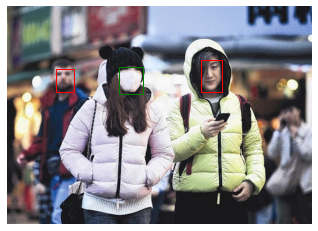

Target
label: tensor(1, device='cuda:0')
label: tensor(3, device='cuda:0')
label: tensor(1, device='cuda:0')


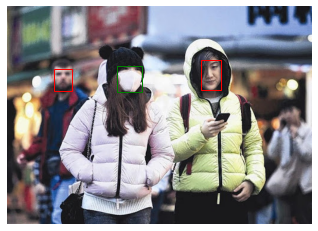

In [ ]:
print("Prediction")
plot_prediction(img_batch[0], preds[0])
print("Target")
plot_regular(img_batch[0], annotation_batch[0])

#3 is correct
#1 is no mask

# Save Model

In [ ]:
torch.save(model.state_dict(),'model.pt')

In [ ]:
# del imgs
# del annotations
# del model

In [ ]:
with torch.no_grad():
    torch.cuda.empty_cache()

# Load Saved Model

In [ ]:
loaded_model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True) # Gets faster rcnn and resnet50 pretrained network
in_features = loaded_model.roi_heads.box_predictor.cls_score.in_features
loaded_model.roi_heads.box_predictor = FastRCNNPredictor(in_features, 4)

In [ ]:
loaded_model.load_state_dict(torch.load('model.pt'))
loaded_model.eval()
loaded_model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
print(torch.cuda.memory_allocated())
print(torch.cuda.memory_reserved())

676944896
960495616


# Run Test Set & Error Analysis

tensor(0.8972)
appended
tensor(0.6191)
tensor(0.3397)
tensor(0.0561)
score: tensor(0.8972, device='cuda:0')
label: tensor(1, device='cuda:0')


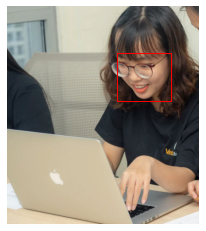

tensor(0.9878)
appended
score: tensor(0.9878, device='cuda:0')
label: tensor(1, device='cuda:0')


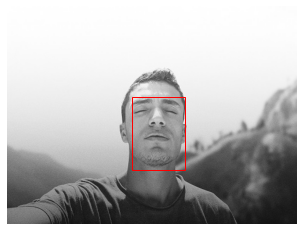

tensor(0.9399)
appended
tensor(0.6190)
tensor(0.5996)
tensor(0.2459)
tensor(0.2228)
tensor(0.1194)
tensor(0.1032)
tensor(0.0867)
tensor(0.0624)
tensor(0.0622)
score: tensor(0.9399, device='cuda:0')
label: tensor(1, device='cuda:0')


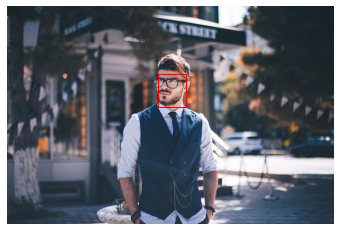

tensor(0.9556)
appended
tensor(0.1920)
tensor(0.0557)
score: tensor(0.9556, device='cuda:0')
label: tensor(1, device='cuda:0')


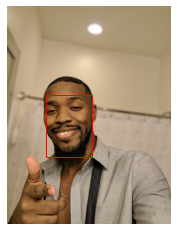

tensor(0.8011)
appended
tensor(0.1868)
tensor(0.0537)
score: tensor(0.8011, device='cuda:0')
label: tensor(3, device='cuda:0')


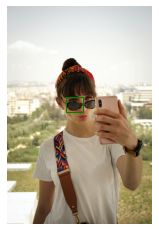

tensor(0.8366)
appended
tensor(0.6654)
tensor(0.6384)
tensor(0.5505)
tensor(0.3987)
tensor(0.0586)
score: tensor(0.8366, device='cuda:0')
label: tensor(3, device='cuda:0')


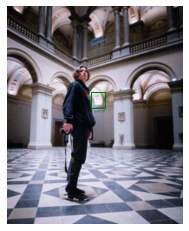

tensor(0.7178)


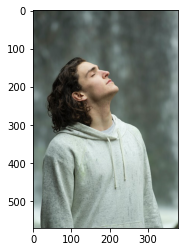

tensor(0.9525)
appended
score: tensor(0.9525, device='cuda:0')
label: tensor(1, device='cuda:0')


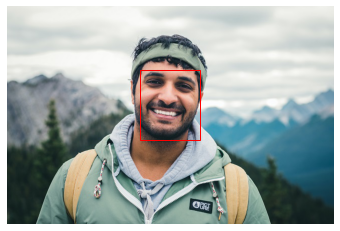

tensor(0.9160)
appended
score: tensor(0.9160, device='cuda:0')
label: tensor(1, device='cuda:0')


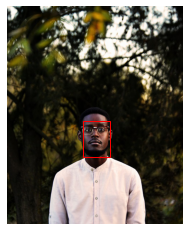

tensor(0.9247)
appended
tensor(0.8265)
appended
tensor(0.2413)
tensor(0.1791)
score: tensor(0.9247, device='cuda:0')
label: tensor(1, device='cuda:0')
score: tensor(0.8265, device='cuda:0')
label: tensor(3, device='cuda:0')


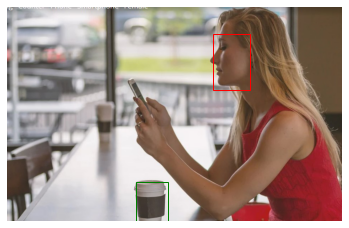

tensor(0.9757)
appended
tensor(0.5628)
tensor(0.3217)
tensor(0.1560)
tensor(0.0537)
score: tensor(0.9757, device='cuda:0')
label: tensor(1, device='cuda:0')


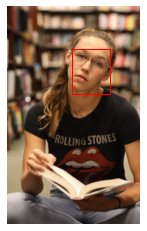

tensor(0.9809)
appended
tensor(0.0853)
score: tensor(0.9809, device='cuda:0')
label: tensor(1, device='cuda:0')


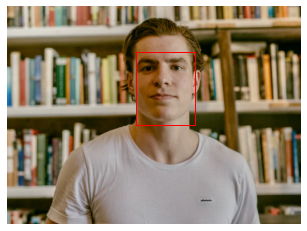

tensor(0.9238)
appended
tensor(0.1463)
score: tensor(0.9238, device='cuda:0')
label: tensor(1, device='cuda:0')


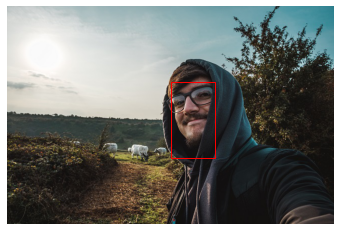

tensor(0.9034)
appended
tensor(0.3315)
score: tensor(0.9034, device='cuda:0')
label: tensor(1, device='cuda:0')


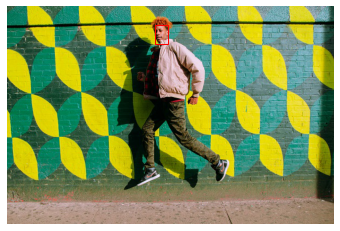

tensor(0.9353)
appended
tensor(0.6381)
tensor(0.3015)
tensor(0.2614)
tensor(0.0825)
tensor(0.0638)
score: tensor(0.9353, device='cuda:0')
label: tensor(3, device='cuda:0')


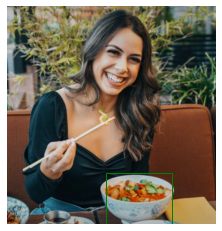

tensor(0.9388)
appended
tensor(0.4411)
score: tensor(0.9388, device='cuda:0')
label: tensor(1, device='cuda:0')


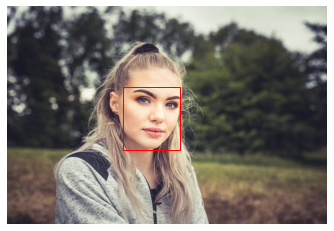

tensor(0.9730)
appended
tensor(0.2033)
score: tensor(0.9730, device='cuda:0')
label: tensor(1, device='cuda:0')


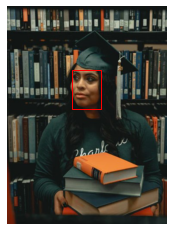

tensor(0.8037)
appended
tensor(0.1099)
score: tensor(0.8037, device='cuda:0')
label: tensor(1, device='cuda:0')


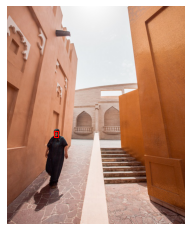

tensor(0.9793)
appended
tensor(0.0688)
score: tensor(0.9793, device='cuda:0')
label: tensor(1, device='cuda:0')


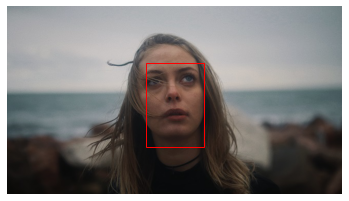

tensor(0.9764)
appended
tensor(0.7556)
appended
tensor(0.6974)
tensor(0.6930)
tensor(0.4088)
tensor(0.3545)
tensor(0.2996)
tensor(0.2050)
tensor(0.1465)
tensor(0.1438)
tensor(0.1103)
tensor(0.1014)
tensor(0.0972)
tensor(0.0731)
tensor(0.0721)
tensor(0.0720)
score: tensor(0.9764, device='cuda:0')
label: tensor(1, device='cuda:0')
score: tensor(0.7556, device='cuda:0')
label: tensor(3, device='cuda:0')


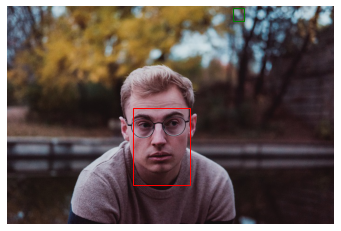

tensor(0.9716)
appended
tensor(0.2820)
tensor(0.1018)
tensor(0.0572)
score: tensor(0.9716, device='cuda:0')
label: tensor(1, device='cuda:0')


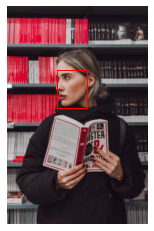

tensor(0.9677)
appended
tensor(0.4304)
tensor(0.2707)
tensor(0.0943)
tensor(0.0744)
score: tensor(0.9677, device='cuda:0')
label: tensor(1, device='cuda:0')


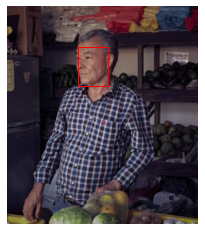

tensor(0.9938)
appended
score: tensor(0.9938, device='cuda:0')
label: tensor(3, device='cuda:0')


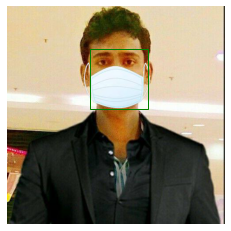

tensor(0.9957)
appended
tensor(0.2172)
tensor(0.0747)
score: tensor(0.9957, device='cuda:0')
label: tensor(3, device='cuda:0')


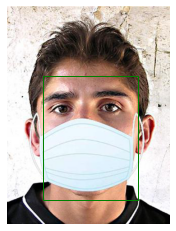

tensor(0.9962)
appended
score: tensor(0.9962, device='cuda:0')
label: tensor(3, device='cuda:0')


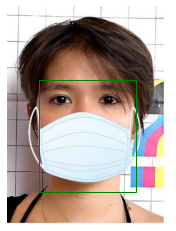

tensor(0.9975)
appended
tensor(0.0502)
score: tensor(0.9975, device='cuda:0')
label: tensor(3, device='cuda:0')


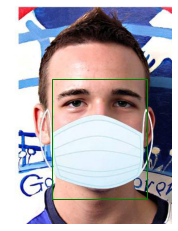

tensor(0.9957)
appended
tensor(0.2268)
tensor(0.1098)
score: tensor(0.9957, device='cuda:0')
label: tensor(3, device='cuda:0')


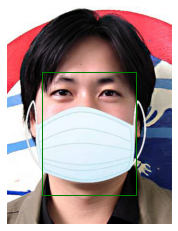

tensor(0.9969)
appended
tensor(0.5373)
tensor(0.1685)
tensor(0.0893)
tensor(0.0884)
score: tensor(0.9969, device='cuda:0')
label: tensor(3, device='cuda:0')


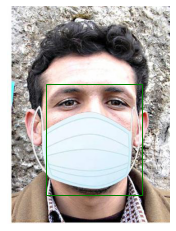

tensor(0.9919)
appended
tensor(0.1721)
tensor(0.1091)
score: tensor(0.9919, device='cuda:0')
label: tensor(3, device='cuda:0')


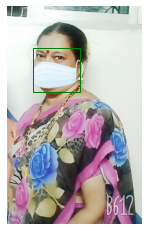

tensor(0.9964)
appended
tensor(0.1312)
score: tensor(0.9964, device='cuda:0')
label: tensor(3, device='cuda:0')


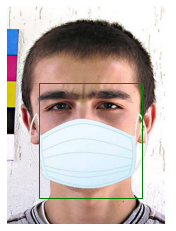

tensor(0.9941)
appended
tensor(0.1168)
score: tensor(0.9941, device='cuda:0')
label: tensor(3, device='cuda:0')


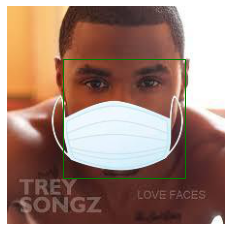

tensor(0.9965)
appended
tensor(0.0613)
tensor(0.0585)
score: tensor(0.9965, device='cuda:0')
label: tensor(3, device='cuda:0')


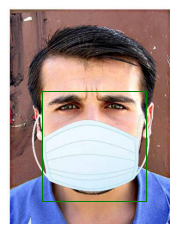

tensor(0.9965)
appended
score: tensor(0.9965, device='cuda:0')
label: tensor(3, device='cuda:0')


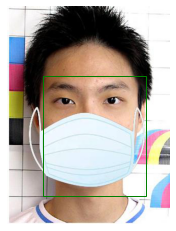

tensor(0.9938)
appended
tensor(0.1034)
tensor(0.0753)
score: tensor(0.9938, device='cuda:0')
label: tensor(3, device='cuda:0')


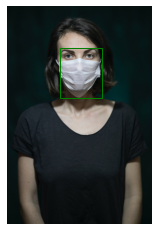

tensor(0.9973)
appended
tensor(0.1071)
tensor(0.0648)
tensor(0.0518)
score: tensor(0.9973, device='cuda:0')
label: tensor(3, device='cuda:0')


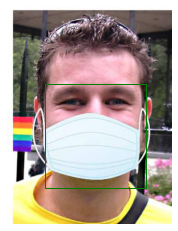

tensor(0.9977)
appended
tensor(0.1227)
tensor(0.0571)
score: tensor(0.9977, device='cuda:0')
label: tensor(3, device='cuda:0')


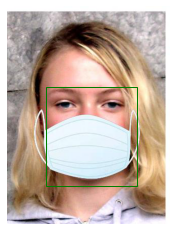

tensor(0.9974)
appended
tensor(0.9202)
appended
tensor(0.6967)
tensor(0.2575)
score: tensor(0.9974, device='cuda:0')
label: tensor(3, device='cuda:0')
score: tensor(0.9202, device='cuda:0')
label: tensor(1, device='cuda:0')


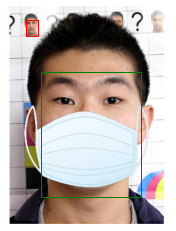

tensor(0.9882)
appended
tensor(0.5100)
tensor(0.0603)
score: tensor(0.9882, device='cuda:0')
label: tensor(3, device='cuda:0')


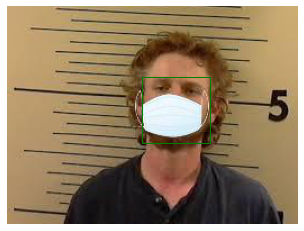

tensor(0.9978)
appended
score: tensor(0.9978, device='cuda:0')
label: tensor(3, device='cuda:0')


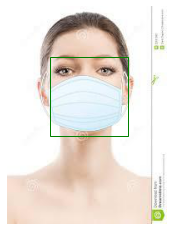

tensor(0.9970)
appended
score: tensor(0.9970, device='cuda:0')
label: tensor(3, device='cuda:0')


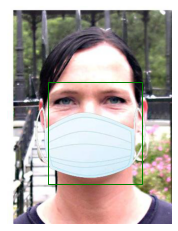

tensor(0.9905)
appended
tensor(0.3817)
tensor(0.2379)
tensor(0.1701)
tensor(0.1005)
tensor(0.0537)
score: tensor(0.9905, device='cuda:0')
label: tensor(3, device='cuda:0')


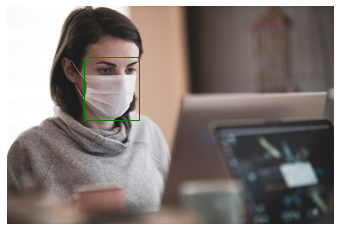

tensor(0.9943)
appended
tensor(0.4542)
tensor(0.1005)
tensor(0.1001)
score: tensor(0.9943, device='cuda:0')
label: tensor(3, device='cuda:0')


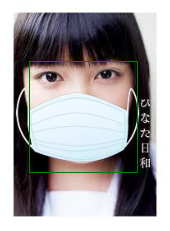

tensor(0.9957)
appended
tensor(0.1928)
tensor(0.1810)
score: tensor(0.9957, device='cuda:0')
label: tensor(3, device='cuda:0')


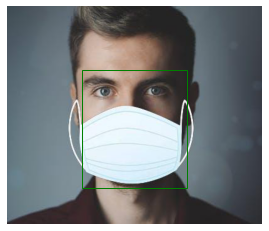

tensor(0.9960)
appended
tensor(0.4407)
score: tensor(0.9960, device='cuda:0')
label: tensor(3, device='cuda:0')


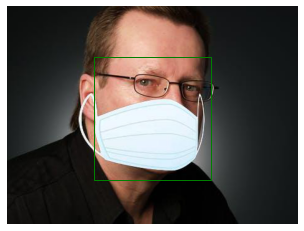

tensor(0.9943)
appended
tensor(0.2148)
score: tensor(0.9943, device='cuda:0')
label: tensor(3, device='cuda:0')


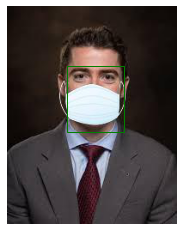

tensor(0.9974)
appended
tensor(0.5249)
score: tensor(0.9974, device='cuda:0')
label: tensor(3, device='cuda:0')


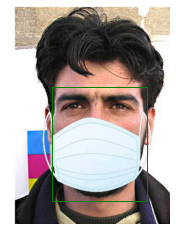

tensor(0.9961)
appended
tensor(0.3742)
score: tensor(0.9961, device='cuda:0')
label: tensor(3, device='cuda:0')


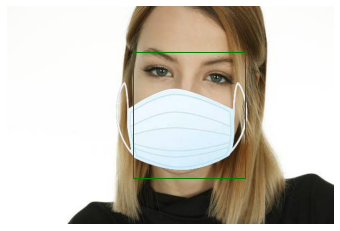

tensor(0.9958)
appended
score: tensor(0.9958, device='cuda:0')
label: tensor(3, device='cuda:0')


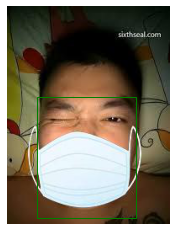

tensor(0.9936)
appended
tensor(0.0639)
score: tensor(0.9936, device='cuda:0')
label: tensor(3, device='cuda:0')


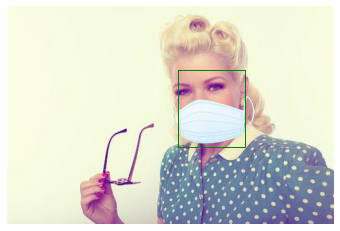

tensor(0.9974)
appended
tensor(0.2994)
score: tensor(0.9974, device='cuda:0')
label: tensor(3, device='cuda:0')


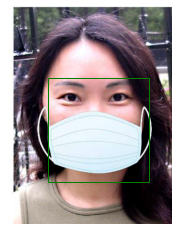

tensor(0.9972)
appended
tensor(0.5398)
tensor(0.3342)
tensor(0.1564)
score: tensor(0.9972, device='cuda:0')
label: tensor(3, device='cuda:0')


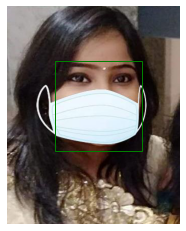

tensor(0.9979)
appended
tensor(0.5653)
tensor(0.1074)
score: tensor(0.9979, device='cuda:0')
label: tensor(3, device='cuda:0')


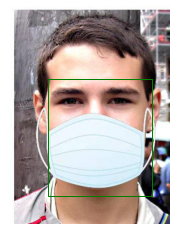

tensor(0.9973)
appended
tensor(0.5174)
tensor(0.1873)
tensor(0.1518)
tensor(0.1447)
tensor(0.1072)
tensor(0.0643)
score: tensor(0.9973, device='cuda:0')
label: tensor(3, device='cuda:0')


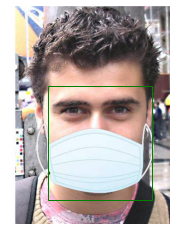

tensor(0.9976)
appended
tensor(0.8622)
appended
tensor(0.8023)
appended
tensor(0.3935)
tensor(0.3241)
tensor(0.2108)
score: tensor(0.9976, device='cuda:0')
label: tensor(3, device='cuda:0')
score: tensor(0.8622, device='cuda:0')
label: tensor(3, device='cuda:0')
score: tensor(0.8023, device='cuda:0')
label: tensor(1, device='cuda:0')


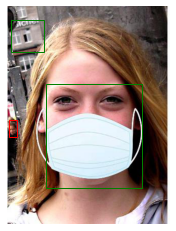

tensor(0.9969)
appended
tensor(0.0778)
score: tensor(0.9969, device='cuda:0')
label: tensor(3, device='cuda:0')


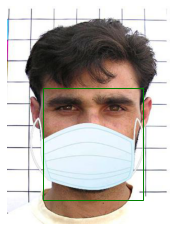

tensor(0.9946)
appended
tensor(0.9898)
appended
tensor(0.0743)
tensor(0.0568)
score: tensor(0.9946, device='cuda:0')
label: tensor(3, device='cuda:0')
score: tensor(0.9898, device='cuda:0')
label: tensor(3, device='cuda:0')


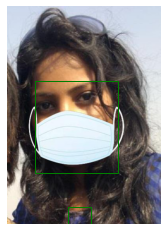

tensor(0.9975)
appended
score: tensor(0.9975, device='cuda:0')
label: tensor(3, device='cuda:0')


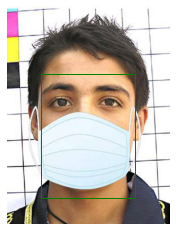

tensor(0.9905)
appended
score: tensor(0.9905, device='cuda:0')
label: tensor(3, device='cuda:0')


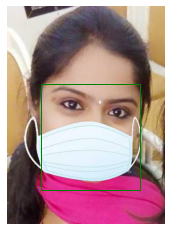

tensor(0.9964)
appended
tensor(0.6691)
tensor(0.1646)
tensor(0.1599)
tensor(0.0673)
score: tensor(0.9964, device='cuda:0')
label: tensor(3, device='cuda:0')


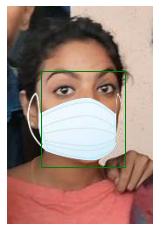

tensor(0.9949)
appended
tensor(0.3941)
tensor(0.0701)
score: tensor(0.9949, device='cuda:0')
label: tensor(3, device='cuda:0')


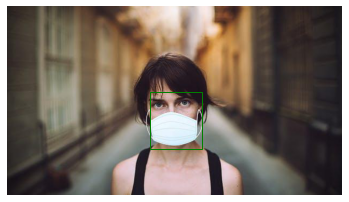

tensor(0.9970)
appended
tensor(0.0692)
score: tensor(0.9970, device='cuda:0')
label: tensor(3, device='cuda:0')


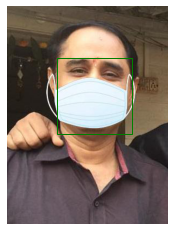

tensor(0.9951)
appended
tensor(0.5156)
tensor(0.2262)
tensor(0.0691)
score: tensor(0.9951, device='cuda:0')
label: tensor(3, device='cuda:0')


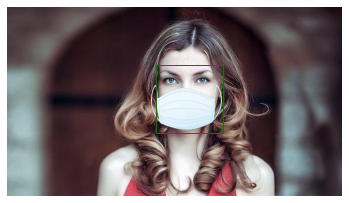

tensor(0.9963)
appended
score: tensor(0.9963, device='cuda:0')
label: tensor(3, device='cuda:0')


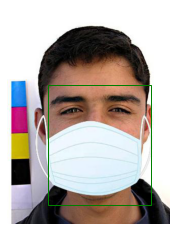

tensor(0.9948)
appended
tensor(0.3962)
tensor(0.3674)
tensor(0.2057)
tensor(0.1532)
tensor(0.1182)
tensor(0.0645)
tensor(0.0577)
score: tensor(0.9948, device='cuda:0')
label: tensor(3, device='cuda:0')


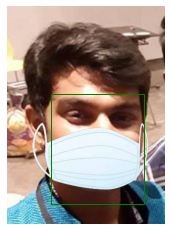

tensor(0.9970)
appended
tensor(0.3411)
tensor(0.2275)
score: tensor(0.9970, device='cuda:0')
label: tensor(3, device='cuda:0')


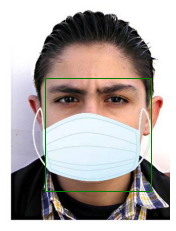

tensor(0.9965)
appended
tensor(0.6465)
tensor(0.4427)
tensor(0.3797)
tensor(0.1542)
tensor(0.0945)
tensor(0.0919)
tensor(0.0815)
score: tensor(0.9965, device='cuda:0')
label: tensor(3, device='cuda:0')


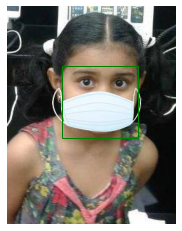

tensor(0.9955)
appended
score: tensor(0.9955, device='cuda:0')
label: tensor(3, device='cuda:0')


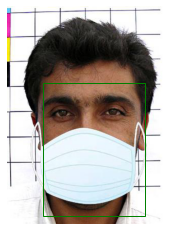

tensor(0.9951)
appended
tensor(0.2895)
tensor(0.0886)
tensor(0.0660)
tensor(0.0554)
tensor(0.0538)
score: tensor(0.9951, device='cuda:0')
label: tensor(3, device='cuda:0')


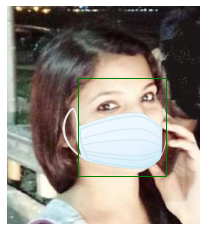

tensor(0.9929)
appended
tensor(0.3325)
tensor(0.1817)
tensor(0.0713)
score: tensor(0.9929, device='cuda:0')
label: tensor(3, device='cuda:0')


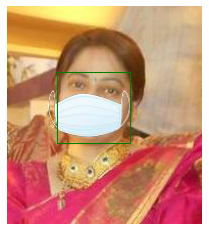

tensor(0.9943)
appended
tensor(0.4867)
tensor(0.4647)
tensor(0.1636)
tensor(0.1140)
tensor(0.0534)
score: tensor(0.9943, device='cuda:0')
label: tensor(3, device='cuda:0')


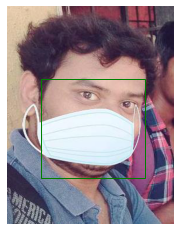

tensor(0.9947)
appended
score: tensor(0.9947, device='cuda:0')
label: tensor(3, device='cuda:0')


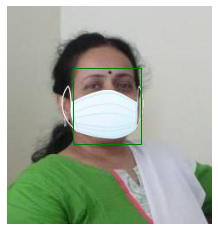

tensor(0.9798)
appended
tensor(0.8702)
appended
tensor(0.5487)
tensor(0.3296)
score: tensor(0.9798, device='cuda:0')
label: tensor(3, device='cuda:0')
score: tensor(0.8702, device='cuda:0')
label: tensor(3, device='cuda:0')


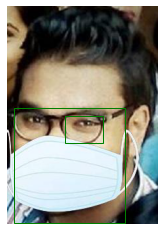

tensor(0.9949)
appended
tensor(0.8672)
appended
tensor(0.8658)
appended
tensor(0.3173)
tensor(0.2428)
tensor(0.0740)
tensor(0.0702)
tensor(0.0598)
score: tensor(0.9949, device='cuda:0')
label: tensor(3, device='cuda:0')
score: tensor(0.8672, device='cuda:0')
label: tensor(3, device='cuda:0')
score: tensor(0.8658, device='cuda:0')
label: tensor(1, device='cuda:0')


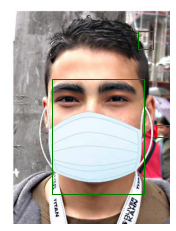

tensor(0.9975)
appended
score: tensor(0.9975, device='cuda:0')
label: tensor(3, device='cuda:0')


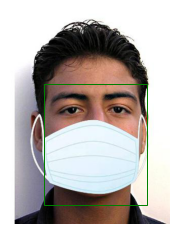

tensor(0.9968)
appended
tensor(0.6177)
tensor(0.2092)
tensor(0.1641)
tensor(0.1334)
tensor(0.0590)
score: tensor(0.9968, device='cuda:0')
label: tensor(3, device='cuda:0')


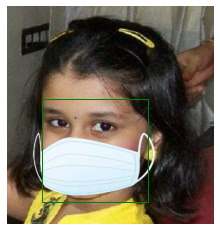

tensor(0.9943)
appended
tensor(0.1147)
score: tensor(0.9943, device='cuda:0')
label: tensor(3, device='cuda:0')


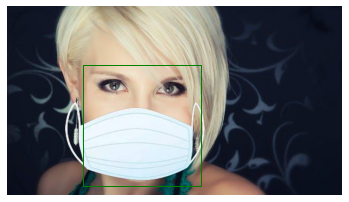

tensor(0.9966)
appended
score: tensor(0.9966, device='cuda:0')
label: tensor(3, device='cuda:0')


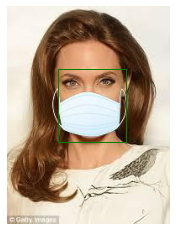

tensor(0.9980)
appended
tensor(0.9778)
appended
score: tensor(0.9980, device='cuda:0')
label: tensor(3, device='cuda:0')
score: tensor(0.9778, device='cuda:0')
label: tensor(3, device='cuda:0')


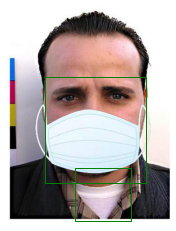

tensor(0.9968)
appended
tensor(0.5804)
score: tensor(0.9968, device='cuda:0')
label: tensor(3, device='cuda:0')


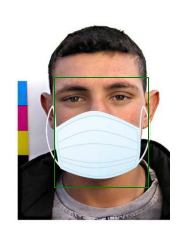

tensor(0.9950)
appended
tensor(0.7733)
appended
tensor(0.0677)
tensor(0.0606)
tensor(0.0558)
score: tensor(0.9950, device='cuda:0')
label: tensor(3, device='cuda:0')
score: tensor(0.7733, device='cuda:0')
label: tensor(3, device='cuda:0')


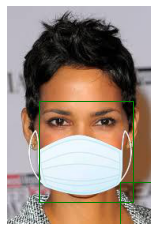

tensor(0.9956)
appended
tensor(0.9924)
appended
tensor(0.1009)
score: tensor(0.9956, device='cuda:0')
label: tensor(3, device='cuda:0')
score: tensor(0.9924, device='cuda:0')
label: tensor(3, device='cuda:0')


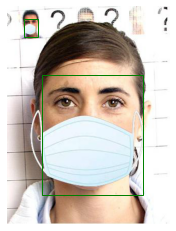

tensor(0.9953)
appended
tensor(0.6961)
tensor(0.1144)
tensor(0.0780)
tensor(0.0601)
tensor(0.0530)
score: tensor(0.9953, device='cuda:0')
label: tensor(3, device='cuda:0')


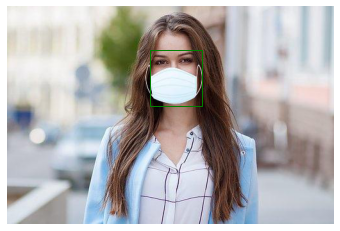

tensor(0.9978)
appended
tensor(0.0812)
score: tensor(0.9978, device='cuda:0')
label: tensor(3, device='cuda:0')


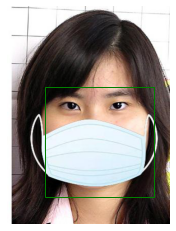

tensor(0.9942)
appended
tensor(0.0932)
tensor(0.0654)
tensor(0.0573)
tensor(0.0537)
tensor(0.0528)
tensor(0.0502)
score: tensor(0.9942, device='cuda:0')
label: tensor(3, device='cuda:0')


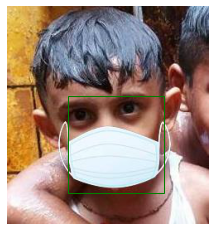

tensor(0.9974)
appended
score: tensor(0.9974, device='cuda:0')
label: tensor(3, device='cuda:0')


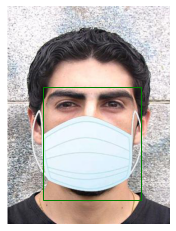

tensor(0.9961)
appended
tensor(0.0986)
score: tensor(0.9961, device='cuda:0')
label: tensor(3, device='cuda:0')


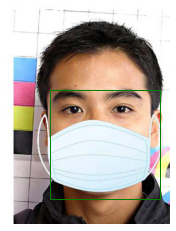

tensor(0.9938)
appended
score: tensor(0.9938, device='cuda:0')
label: tensor(3, device='cuda:0')


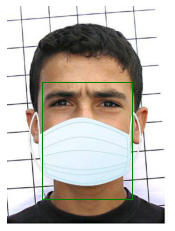

tensor(0.9963)
appended
tensor(0.8645)
appended
tensor(0.2516)
tensor(0.0857)
tensor(0.0611)
score: tensor(0.9963, device='cuda:0')
label: tensor(3, device='cuda:0')
score: tensor(0.8645, device='cuda:0')
label: tensor(3, device='cuda:0')


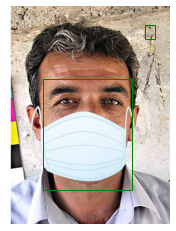

tensor(0.9856)
appended
tensor(0.6356)
tensor(0.1899)
tensor(0.0636)
tensor(0.0514)
score: tensor(0.9856, device='cuda:0')
label: tensor(3, device='cuda:0')


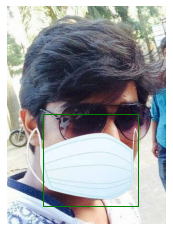

tensor(0.9938)
appended
tensor(0.5931)
tensor(0.4515)
tensor(0.0770)
score: tensor(0.9938, device='cuda:0')
label: tensor(3, device='cuda:0')


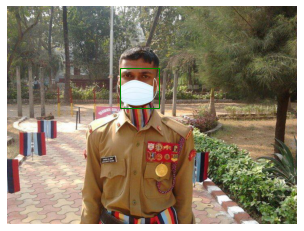

tensor(0.9908)
appended
tensor(0.1755)
score: tensor(0.9908, device='cuda:0')
label: tensor(3, device='cuda:0')


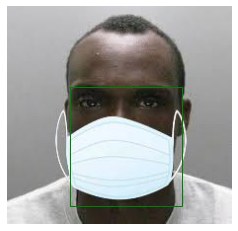

tensor(0.9950)
appended
tensor(0.4681)
tensor(0.1081)
score: tensor(0.9950, device='cuda:0')
label: tensor(3, device='cuda:0')


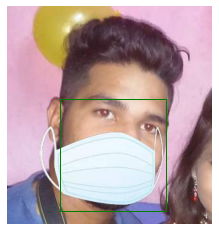

tensor(0.9966)
appended
tensor(0.2442)
score: tensor(0.9966, device='cuda:0')
label: tensor(3, device='cuda:0')


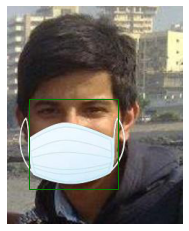

tensor(0.9974)
appended
score: tensor(0.9974, device='cuda:0')
label: tensor(3, device='cuda:0')


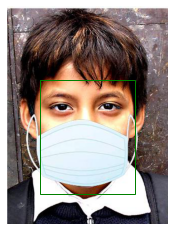

tensor(0.9959)
appended
tensor(0.1664)
score: tensor(0.9959, device='cuda:0')
label: tensor(3, device='cuda:0')


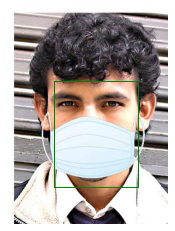

tensor(0.9957)
appended
score: tensor(0.9957, device='cuda:0')
label: tensor(3, device='cuda:0')


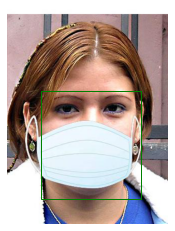

tensor(0.9974)
appended
tensor(0.5239)
tensor(0.1952)
tensor(0.1582)
tensor(0.1422)
tensor(0.1058)
tensor(0.0849)
tensor(0.0575)
tensor(0.0535)
score: tensor(0.9974, device='cuda:0')
label: tensor(3, device='cuda:0')


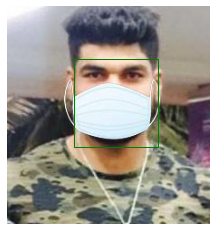

tensor(0.9867)
appended
tensor(0.0502)
score: tensor(0.9867, device='cuda:0')
label: tensor(3, device='cuda:0')


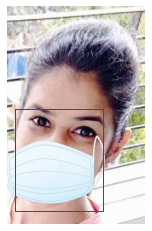

tensor(0.9897)
appended
tensor(0.7843)
appended
tensor(0.0745)
tensor(0.0659)
score: tensor(0.9897, device='cuda:0')
label: tensor(3, device='cuda:0')
score: tensor(0.7843, device='cuda:0')
label: tensor(3, device='cuda:0')


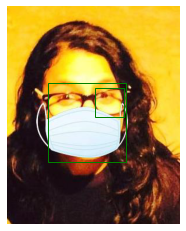

tensor(0.9944)
appended
score: tensor(0.9944, device='cuda:0')
label: tensor(3, device='cuda:0')


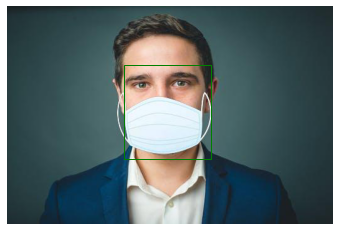

tensor(0.9960)
appended
score: tensor(0.9960, device='cuda:0')
label: tensor(3, device='cuda:0')


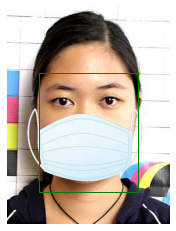

tensor(0.9941)
appended
tensor(0.3424)
tensor(0.3327)
tensor(0.2983)
tensor(0.2848)
tensor(0.1638)
tensor(0.1213)
tensor(0.1128)
tensor(0.0891)
tensor(0.0830)
tensor(0.0821)
tensor(0.0789)
tensor(0.0775)
tensor(0.0762)
tensor(0.0750)
tensor(0.0688)
tensor(0.0680)
tensor(0.0637)
tensor(0.0537)
tensor(0.0531)
tensor(0.0509)
score: tensor(0.9941, device='cuda:0')
label: tensor(3, device='cuda:0')


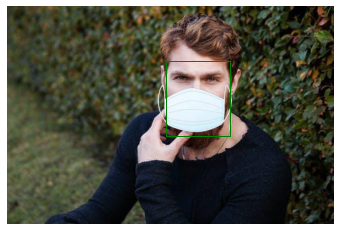

tensor(0.9953)
appended
tensor(0.2452)
tensor(0.1589)
tensor(0.1198)
tensor(0.0942)
tensor(0.0530)
score: tensor(0.9953, device='cuda:0')
label: tensor(3, device='cuda:0')


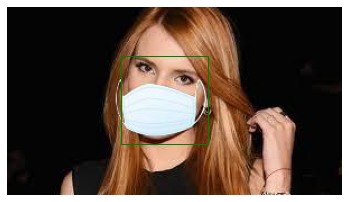

tensor(0.9958)
appended
tensor(0.3193)
score: tensor(0.9958, device='cuda:0')
label: tensor(3, device='cuda:0')


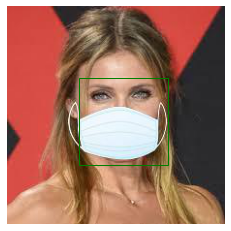

tensor(0.9932)
appended
tensor(0.0561)
score: tensor(0.9932, device='cuda:0')
label: tensor(3, device='cuda:0')


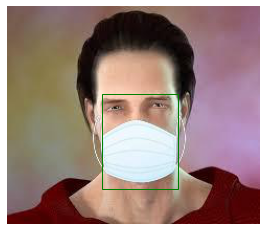

tensor(0.9970)
appended
score: tensor(0.9970, device='cuda:0')
label: tensor(3, device='cuda:0')


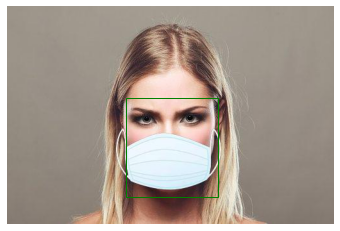

tensor(0.9969)
appended
tensor(0.9097)
appended
tensor(0.6613)
tensor(0.1498)
tensor(0.0816)
tensor(0.0630)
score: tensor(0.9969, device='cuda:0')
label: tensor(3, device='cuda:0')
score: tensor(0.9097, device='cuda:0')
label: tensor(3, device='cuda:0')


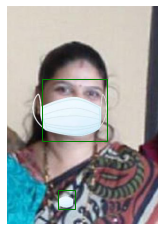

tensor(0.9862)
appended
tensor(0.1487)
score: tensor(0.9862, device='cuda:0')
label: tensor(3, device='cuda:0')


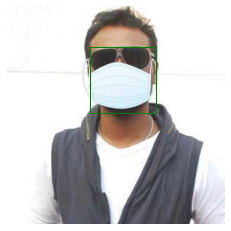

tensor(0.9901)
appended
tensor(0.1314)
tensor(0.0547)
score: tensor(0.9901, device='cuda:0')
label: tensor(3, device='cuda:0')


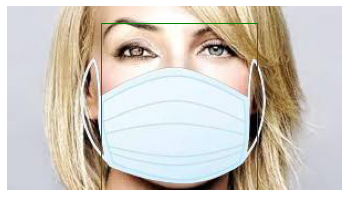

tensor(0.9952)
appended
tensor(0.3376)
tensor(0.2487)
tensor(0.0893)
score: tensor(0.9952, device='cuda:0')
label: tensor(3, device='cuda:0')


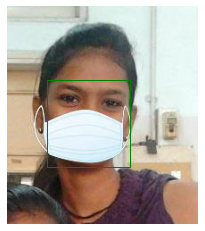

tensor(0.9955)
appended
tensor(0.3301)
tensor(0.3267)
tensor(0.1358)
tensor(0.1345)
score: tensor(0.9955, device='cuda:0')
label: tensor(3, device='cuda:0')


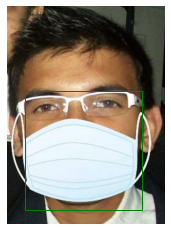

tensor(0.9966)
appended
tensor(0.1068)
tensor(0.0981)
score: tensor(0.9966, device='cuda:0')
label: tensor(3, device='cuda:0')


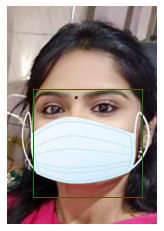

tensor(0.9954)
appended
score: tensor(0.9954, device='cuda:0')
label: tensor(3, device='cuda:0')


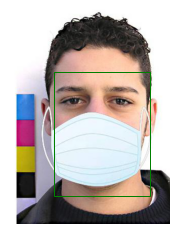

tensor(0.9963)
appended
tensor(0.2951)
score: tensor(0.9963, device='cuda:0')
label: tensor(3, device='cuda:0')


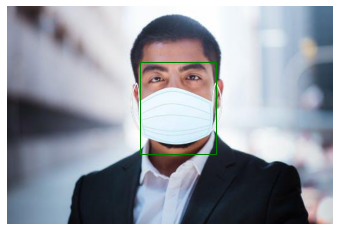

tensor(0.9947)
appended
tensor(0.0831)
score: tensor(0.9947, device='cuda:0')
label: tensor(3, device='cuda:0')


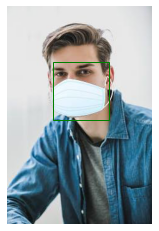

tensor(0.9932)
appended
tensor(0.0599)
tensor(0.0540)
score: tensor(0.9932, device='cuda:0')
label: tensor(3, device='cuda:0')


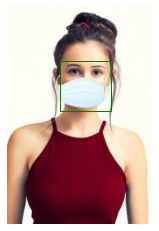

tensor(0.9960)
appended
tensor(0.0596)
score: tensor(0.9960, device='cuda:0')
label: tensor(3, device='cuda:0')


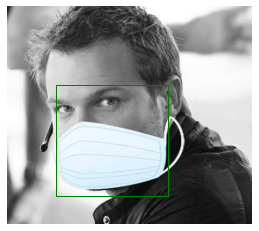

tensor(0.9956)
appended
tensor(0.0660)
score: tensor(0.9956, device='cuda:0')
label: tensor(3, device='cuda:0')


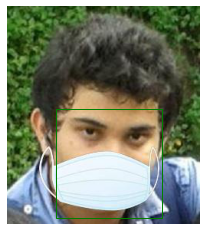

tensor(0.9858)
appended
tensor(0.3631)
tensor(0.3456)
tensor(0.2519)
tensor(0.1055)
tensor(0.0693)
tensor(0.0504)
score: tensor(0.9858, device='cuda:0')
label: tensor(3, device='cuda:0')


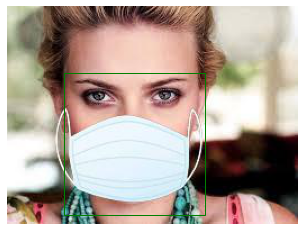

tensor(0.9962)
appended
tensor(0.9172)
appended
tensor(0.3033)
tensor(0.0547)
score: tensor(0.9962, device='cuda:0')
label: tensor(3, device='cuda:0')
score: tensor(0.9172, device='cuda:0')
label: tensor(1, device='cuda:0')


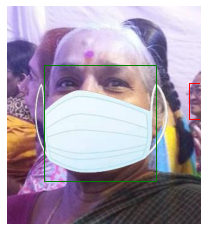

tensor(0.9981)
appended
tensor(0.6360)
tensor(0.0672)
tensor(0.0651)
tensor(0.0619)
score: tensor(0.9981, device='cuda:0')
label: tensor(3, device='cuda:0')


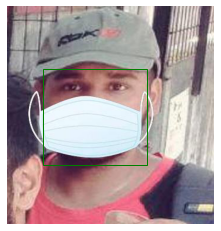

tensor(0.9948)
appended
tensor(0.3437)
tensor(0.1046)
score: tensor(0.9948, device='cuda:0')
label: tensor(3, device='cuda:0')


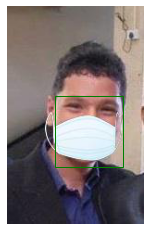

tensor(0.9938)
appended
tensor(0.1309)
tensor(0.0575)
score: tensor(0.9938, device='cuda:0')
label: tensor(3, device='cuda:0')


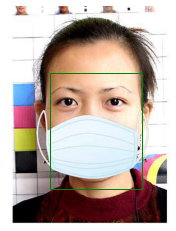

tensor(0.9961)
appended
score: tensor(0.9961, device='cuda:0')
label: tensor(3, device='cuda:0')


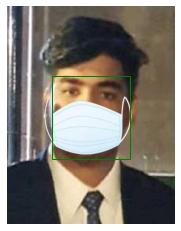

tensor(0.9970)
appended
tensor(0.4668)
tensor(0.2101)
score: tensor(0.9970, device='cuda:0')
label: tensor(3, device='cuda:0')


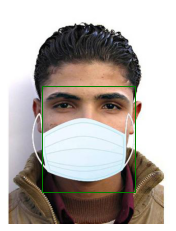

tensor(0.9959)
appended
tensor(0.2622)
tensor(0.0682)
score: tensor(0.9959, device='cuda:0')
label: tensor(3, device='cuda:0')


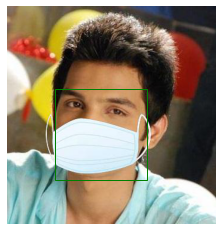

tensor(0.9898)
appended
tensor(0.1751)
tensor(0.1526)
score: tensor(0.9898, device='cuda:0')
label: tensor(3, device='cuda:0')


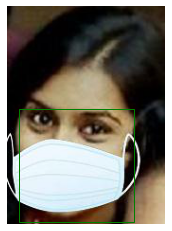

tensor(0.9969)
appended
tensor(0.0548)
score: tensor(0.9969, device='cuda:0')
label: tensor(3, device='cuda:0')


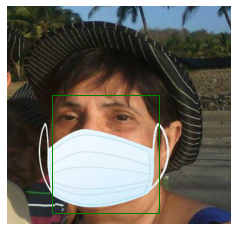

tensor(0.9960)
appended
score: tensor(0.9960, device='cuda:0')
label: tensor(3, device='cuda:0')


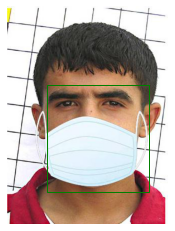

tensor(0.9979)
appended
score: tensor(0.9979, device='cuda:0')
label: tensor(3, device='cuda:0')


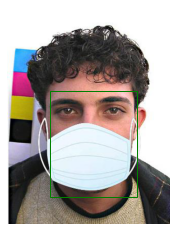

tensor(0.9955)
appended
tensor(0.3764)
tensor(0.2259)
tensor(0.0739)
score: tensor(0.9955, device='cuda:0')
label: tensor(3, device='cuda:0')


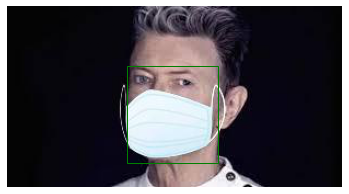

tensor(0.9967)
appended
tensor(0.7446)
tensor(0.7102)
score: tensor(0.9967, device='cuda:0')
label: tensor(3, device='cuda:0')


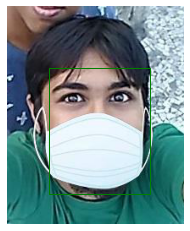

tensor(0.9969)
appended
tensor(0.1709)
score: tensor(0.9969, device='cuda:0')
label: tensor(3, device='cuda:0')


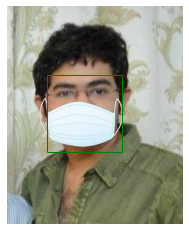

tensor(0.9976)
appended
tensor(0.0577)
score: tensor(0.9976, device='cuda:0')
label: tensor(3, device='cuda:0')


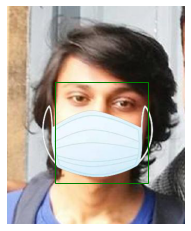

tensor(0.9970)
appended
tensor(0.5006)
tensor(0.1520)
score: tensor(0.9970, device='cuda:0')
label: tensor(3, device='cuda:0')


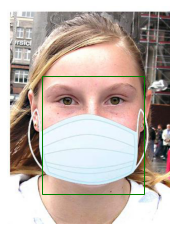

tensor(0.9925)
appended
tensor(0.3725)
tensor(0.3164)
tensor(0.2485)
tensor(0.1259)
tensor(0.0695)
score: tensor(0.9925, device='cuda:0')
label: tensor(3, device='cuda:0')


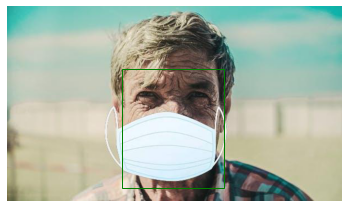

tensor(0.9968)
appended
tensor(0.5059)
tensor(0.1986)
tensor(0.1175)
tensor(0.1144)
tensor(0.1047)
tensor(0.1039)
tensor(0.0965)
tensor(0.0944)
tensor(0.0798)
tensor(0.0637)
tensor(0.0568)
score: tensor(0.9968, device='cuda:0')
label: tensor(3, device='cuda:0')


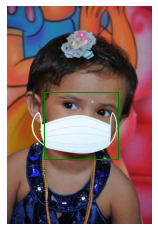

tensor(0.9961)
appended
tensor(0.0634)
score: tensor(0.9961, device='cuda:0')
label: tensor(3, device='cuda:0')


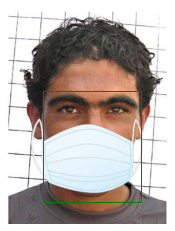

tensor(0.9959)
appended
score: tensor(0.9959, device='cuda:0')
label: tensor(3, device='cuda:0')


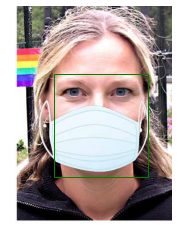

tensor(0.9975)
appended
tensor(0.6173)
tensor(0.0662)
score: tensor(0.9975, device='cuda:0')
label: tensor(3, device='cuda:0')


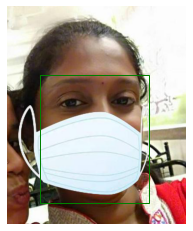

In [ ]:
def load_images(folder):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = Image.open(img_path).convert("RGB")
        images.append(img)

            
    return images

true_positive, true_negative, false_positive, false_negative = 0, 0, 0, 0

def classification_result(actual, prediction):
  global true_positive, true_negative, false_positive, false_negative

  if prediction is None:
    prediction = not actual

  if actual and prediction:
    true_positive += 1
  elif actual and not prediction:
    false_negative += 1
  elif not actual and prediction:
    false_positive += 1
  elif not actual and not prediction:
    true_negative += 1
  

def run_test_set():
  global wearing_mask
  batch_size = 2
  no_mask_images = load_images("PD/test_set_no_mask/")
  mask_images = load_images("PD/test_set_with_mask/")
  count = 0
  test_batch = []
  for img in no_mask_images:
    if img is not None:
      img = (transforms.ToTensor()(img)).to(device)
      test_batch.append(img)
      count += 1
    if count >= batch_size:
      with torch.no_grad():
        test_pred = loaded_model(test_batch)
      for i in range(len(test_batch)):
        plot_prediction(test_batch[i], test_pred[i])
        classification_result(False, wearing_mask)
      test_batch = []
      count = 0
  test_batch = []
  count = 0
  for img in mask_images:
    if img is not None:
      img = (transforms.ToTensor()(img)).to(device)
      test_batch.append(img)
      count += 1
    if count >= batch_size:
      with torch.no_grad():
        test_pred = loaded_model(test_batch)
      for i in range(len(test_batch)):
        plot_prediction(test_batch[i], test_pred[i])
        classification_result(True, wearing_mask)
      test_batch = []
      count = 0

run_test_set()

In [ ]:
print("True Positive:", true_positive)
print("True Negative:", true_negative)
print("False Positive:", false_positive)
print("False Negative:", false_negative)
precision = true_positive / (true_positive + false_positive)
recall = true_positive / (true_positive + false_negative)
f1 = 2 * (precision * recall / (precision + recall))
print("Accuracy:", (true_positive + true_negative) / (true_positive + true_negative + false_positive + false_negative))
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

True Positive: 118
True Negative: 18
False Positive: 4
False Negative: 0
Accuracy: 0.9714285714285714
Precision: 0.9672131147540983
Recall: 1.0
F1 Score: 0.9833333333333333
